# EE551 Embedded Image Processing
## Assignment 1 - Image Signal Processor (ISP)

### Background
An ISP is a processing block that converts raw sensor images into a colour array. There is a surprising amount of image processing that occurs between image capture and output colour images. In this assignment, you will implement a basic ISP.

You will be provided with samples of binary files containing raw sensor images (details of how to read these image files will be provided). The task is then to convert this raw data into a colour image.

The following processing will be done:
- Read in the image
- Demosaic (convert raw to RGB)
- Apply Colour Correction Matrix (matrix will be provided)
- Apply Denoise (e.g. bilateral filter)
- Apply Edge Enhancement (e.g. unsharp mask)
- Apply Contrast Enhancement (e.g. histogram equalisation)
- Save result to an output file

## Submission Details
Assignment deadline: 11:59 pm on Thursday 2nd October 2025  \
Jupyter Notebook containing submission to be submitted via Canvas \
Total grade: 10% of final module mark \
Submit the assignment as a notebook (i.e. .iynb file) \
Use the following format for your filename: firstname_lastname_assignment1.ipynb


# Submission details:
#### Name: Penikalapati Sai Manoj Kumar
#### ID: 25241477
#### Class code: EE551

In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [25]:
# Useful libraries
%matplotlib inline
import os
import os.path as op

import numpy as np
import cv2
from skimage import exposure
from scipy import ndimage
import matplotlib.pylab as plt


## Read in the raw image file

For this assignment, a raw image file will be provided. This is an image of a photographic test target. The pixel data
is stored as unsigned integers, 8 bits per pixel. The code for reading the image will be provided.

The general process is to read in the binary information, then reshape the array into the image dimensions (in this case, 4096*2160 pixels)


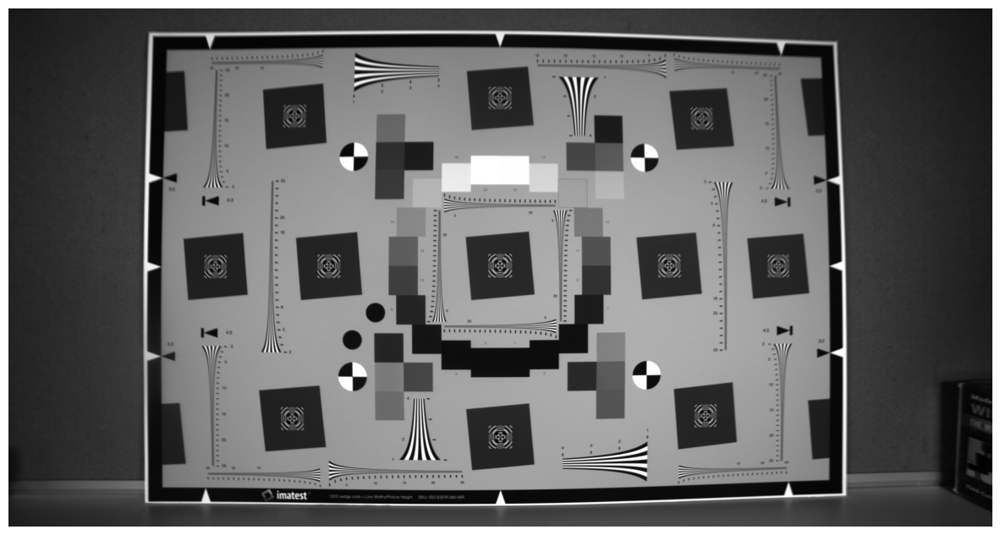

In [26]:
# Read in the file

# Raw file details:
# width - 4096
# height - 2160
# bit depth - 8
# Bayer pattern - rggb


bayer_width = 4096
bayer_height = 2160

raw_path = 'chart.raw'

bayer = np.fromfile(raw_path, dtype='uint8', sep='')

bayer = bayer.reshape((bayer_height, bayer_width))

# plot the resulting raw file inline
plt.figure(figsize=(15,15))
plt.imshow(bayer,cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.show()


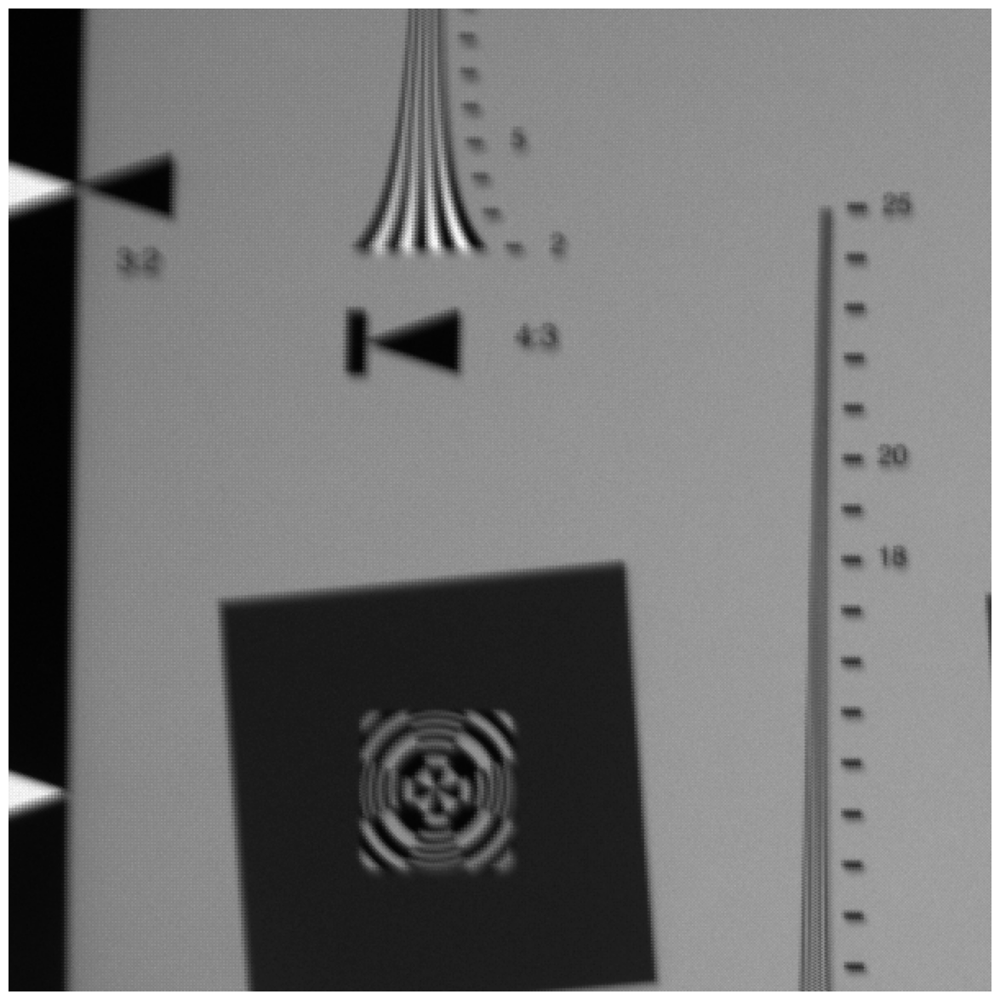

In [6]:
# crop and show a small area, to show the Bayer raw pattern

bayer_crop = bayer[600:1200, 600:1200] 

# plot the resulting raw file inline
plt.figure(figsize=(15,15))
plt.imshow(bayer_crop,cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.show()

## Demosaic the image
The demosaic process converts raw pixel data into RGB image data. Each raw sensor pixel contains only one colour. Part of the demosaic process is to use interpolation to generate the missing colours for each pixel (i.e. a red pixel will get green and blue pixel information from the neighbouring pixels)

Hint: use the opencv "cvtColor" function. This function can be used to convert between many colour spaces. For this assignment, you'll want the "COLOR_BAYER_RG2BGR" option. 

more general details are available here: https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html

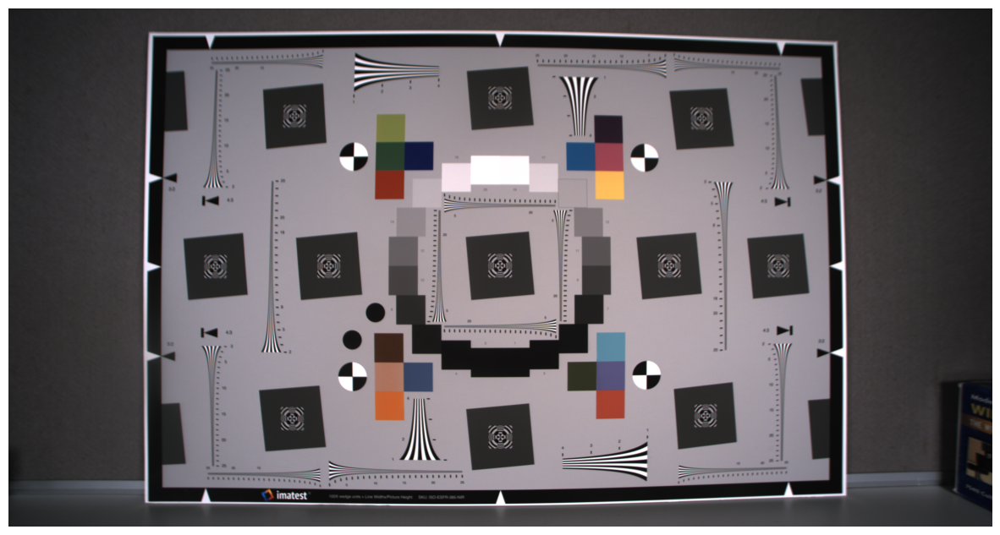

In [27]:
# Demosaic the image (i.e. covert from raw image to RGB)
bayer_demosaic = cv2.cvtColor(bayer, cv2.COLOR_BAYER_RG2BGR)

# plot the resulting raw file inline
plt.figure(figsize=(15,15))
plt.imshow(bayer_demosaic)
plt.axis('off')
plt.show()

## Apply colour correction

A colour correction matrix is applied to improve colour reproduction accuracy. If you notice, red appears too orange before
correction is applied.

The colour correction matrix (CCM) is calculated during the camera development phase, and varies from camera to camera.

For simplicity, the CCM for this particular camera is provided below:
    
    [[ 1382, -113, -246], [ -484, 1808, -300], [ 102, -860, 1802]]
    
 
 This 3*3 matrix is multiplied by the RGB values for every pixel
 
 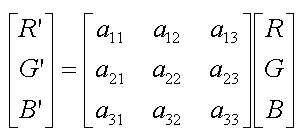
 
 
 
 Note that for embedded applications, floating point numbers are avoided wherever possible. In this example, the base is 1024 (i.e. to convert to floating point, divide the CCM by 1024)
 
 To apply the CCM in this example, the following steps are required:
 - cast the image to np.int32
 - multiply the RGB pixel data by the 3*3 CCM
 - divide by 1024 (note: this can be done by explicit division or right_shift by 10).
 - re-cast the image back to np.uint8
    

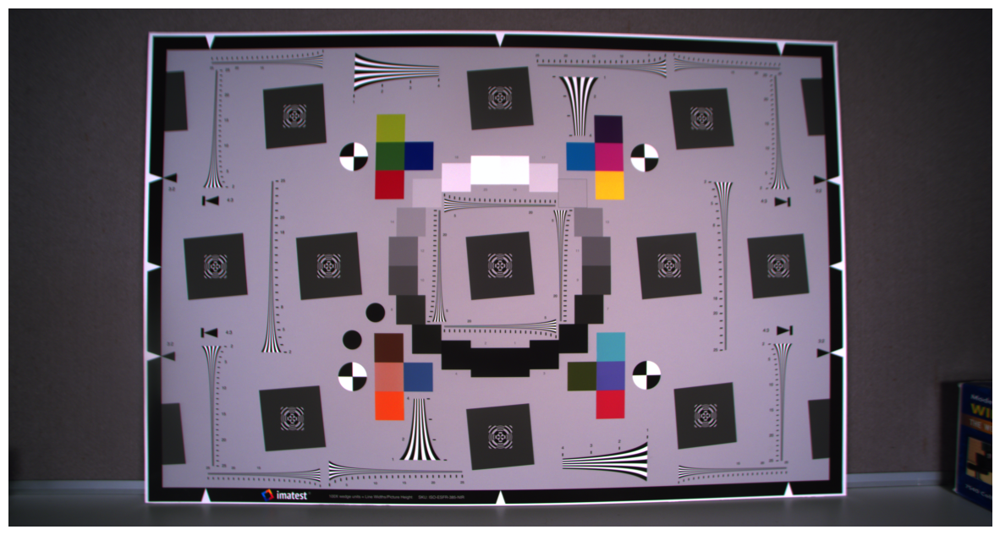

In [28]:
# apply colour correction matrix
# note: to avoid clipping, we have to temporarily cast our image data to int32, and then return to 8 bit
# print(f'initial bayer demosaic image type: {bayer_demosaic.dtype}')
bayer_demosaic = bayer_demosaic.astype(np.int32)
# print(f'after bayer demosaic image type: {bayer_demosaic.dtype}')

# hint - cast the ccm array and image as np.int32
# multiply the image by the ccm matrix, and then use np.right_shift to scale the image down to the 8 bit range again
# use the np.clip function to ensure the data range is within 0 and 255

ccm = np.array([[ 1382, -113, -246], [ -484, 1808, -300], [ 102, -860, 1802]],dtype=np.int32).T

bayer_color_correction = np.clip((bayer_demosaic @ ccm)/1024.0, 0, 255).astype(np.uint8)

# plot the resulting raw file inline
plt.figure(figsize=(15, 15))
plt.imshow(bayer_color_correction)
plt.axis('off')
plt.show();

## Apply gamma correction

Gamma correction is applied using the following formula:

$$
outputImage = ((inputImage / 255)^\gamma) * 255
$$

Typically, $$\gamma=1/2.2$$


hint - use numpy clip function to ensure the data range is within 0 and 255

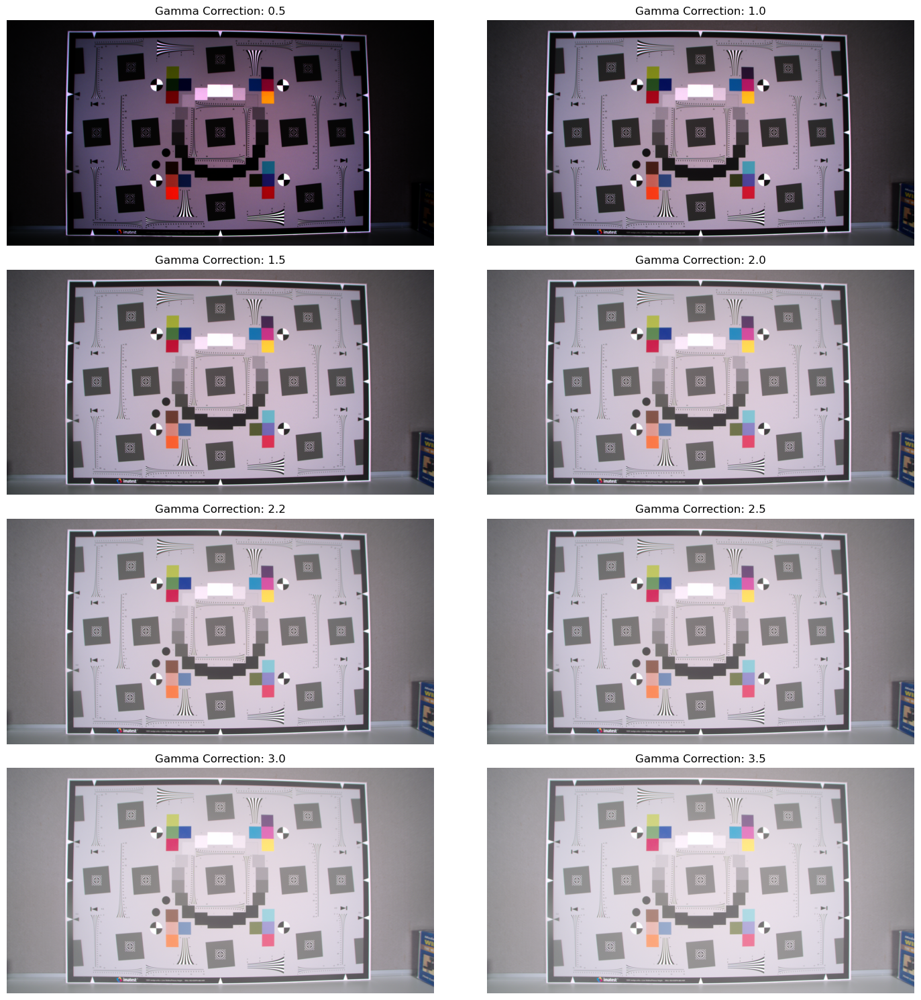

In [29]:
# apply gamma correction
gamma = 1/2.2
bayer_gamma_correction = np.clip((np.power(bayer_color_correction/255, gamma)*255), 0, 255).astype(np.uint8)
# print(bayer_gamma_correction)

def bayer_gamma(img, gamma):
    return np.clip((np.power(img/255, 1/gamma)*255), 0, 255).astype(np.uint8)

# plot the resulting raw file inline
gamma_values = [0.5, 1.0, 1.5, 2.0, 2.2, 2.5, 3.0, 3.5]
n = len(gamma_values)

plt.figure(figsize=(15, 15))

for i, gamma_value in enumerate(gamma_values):
    req_img = bayer_gamma(bayer_color_correction, gamma_value)
    plt.subplot(4, 2, i+1)
    plt.imshow(req_img)
    plt.axis('off')
    plt.title(f'Gamma Correction: {gamma_value}')
    
plt.tight_layout()
plt.show();

## My Observations on Gamma Correction

I have used different gamma values from 0.5 to 3.5

-> At gamma value 0.5, the contrast is low and the background is barely visible

-> As gamma value increases, the contrast rises and reaches close to natural

-> For higher gamma value, the contrast is high and the colors look washed out

## Apply denoise to image

For this block, it is up to the student to decide which denoise block to use as there are several options available. For example, one good option would be openCV's bilateral filter. There isn't necessarily a right or wrong configuration, but changing the approaches & parameters will have an impact on the final image.

Experiment with different denoising appraoches and parameters. Following this, comment on the impact of these approaches/variations. Consider aspects such as (but not limited to) computational cost, artifact generation, and preservation of image details. 

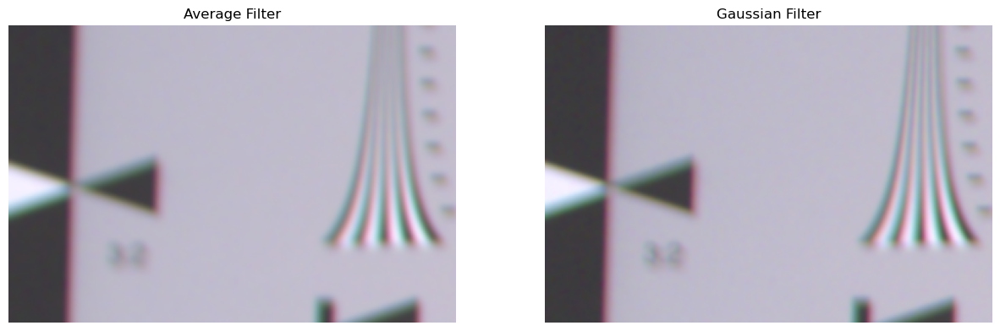

In [45]:
bayer_avg_blur = cv2.blur(bayer_gamma_correction, (5, 5))

bayer_guassian_blur = cv2.GaussianBlur(bayer_gamma_correction, (5, 5), 0)

fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(bayer_avg_blur[600:800, 600:900])
ax[0].axis('off')
ax[0].set_title('Average Filter');

ax[1].imshow(bayer_guassian_blur[600:800, 600:900])
ax[1].axis('off')
ax[1].set_title('Gaussian Filter');

plt.show();

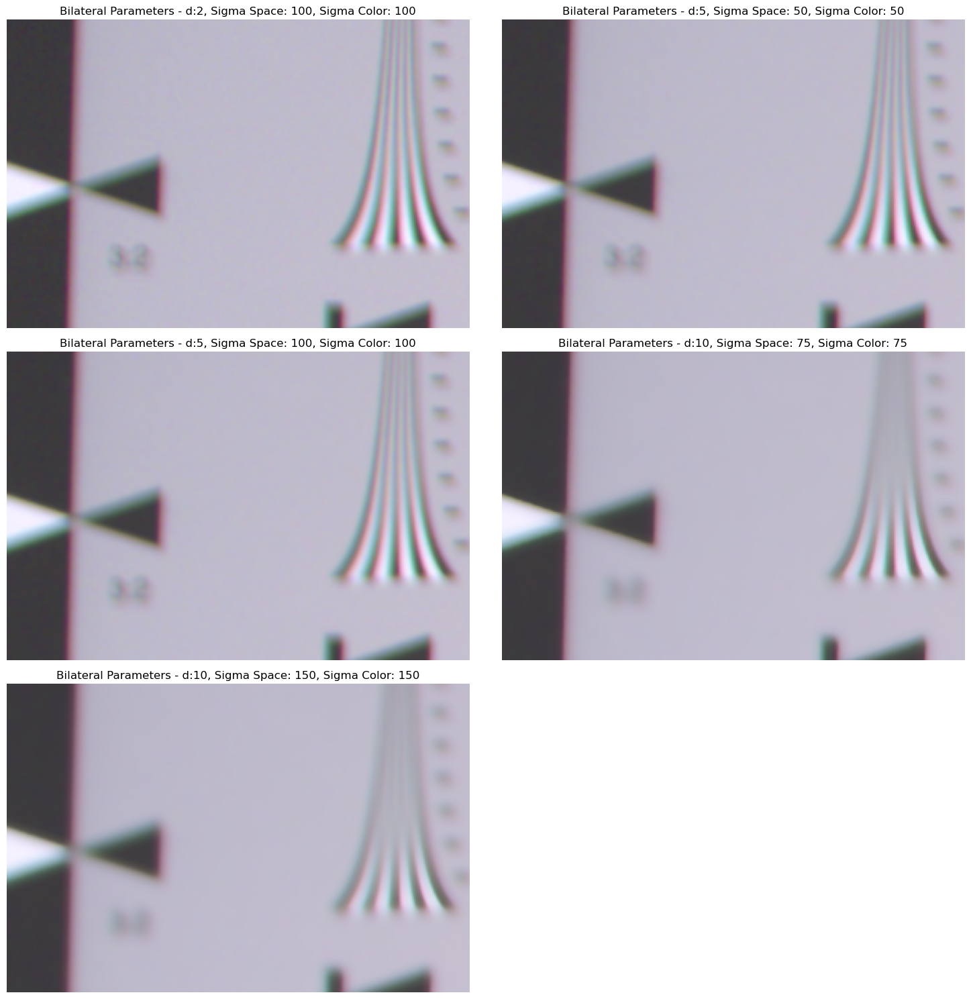

In [35]:
# apply image denoise filtering (bilateral filter)
# hint - use opencv cv2.bilateral filter

parameters_array = [[2, 100, 100], [5, 50, 50], [5, 100, 100], [10, 75, 75], [10, 150, 150]]

bayer_bilateral = cv2.bilateralFilter(bayer_gamma_correction, 5, 100, 100)

# experiment with filter coefficients to see the impact on the image. It might help to crop on an area to get the full effect

# plot the resulting raw file inline
plt.figure(figsize=(15, 15))

for i, parameters in enumerate(parameters_array):
    bayer_bilateral = cv2.bilateralFilter(bayer_gamma_correction, parameters[0], parameters[1], parameters[2])
    plt.subplot(3, 2, i+1)
    plt.imshow(bayer_bilateral[600:800, 600:900])
    plt.axis('off')
    plt.title(f'Bilateral Parameters - d:{parameters[0]}, Sigma Space: {parameters[1]}, Sigma Color: {parameters[2]}')

plt.tight_layout()
plt.show();

## My Observations on Bilateral Filter

-> I experimented with d values (2, 5, 10) and sigma values (50, 75, 100, 150)

-> As the d value increases, the blur in the image increases reducing noise.

-> We may also loose some properties of image as shown with values (10, 150, 150)

-> As sigma value increases, the computation increases. It takes longer to get the result.

-> From my experiment the sigma value has less significance on blur effect

-> Here I am going with (5, 100, 100) for convenience in the next step

## Apply edge enhancement

Apply edge enhancement to the image. Again, it is up to the student to select the edge enhancement approach used (we covered a few options in class).

As before, experiment with different approaches and parameters. Following this, comment on the impact of these approaches/variations. Consider aspects such as (but not limited to) computational cost, artifact generation, and preservation of image details. 

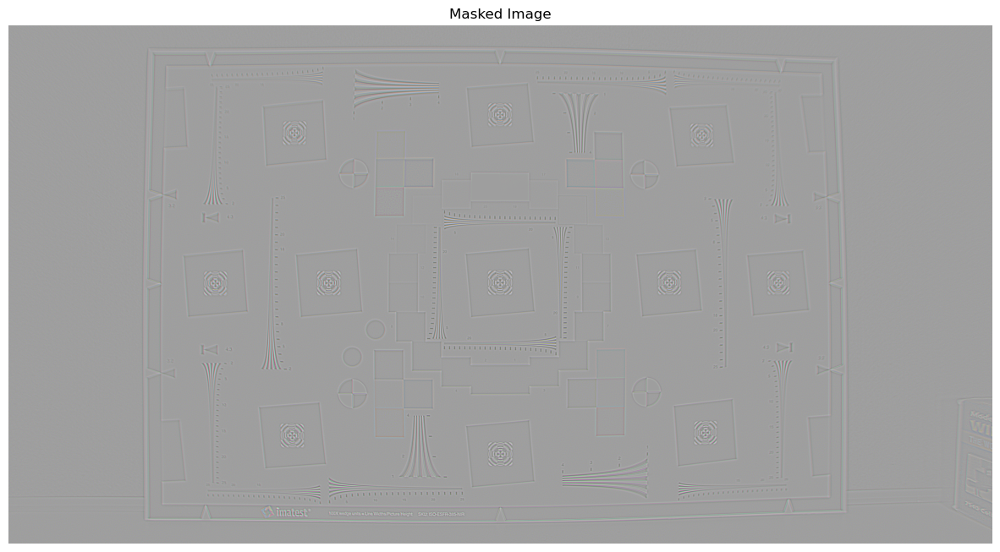

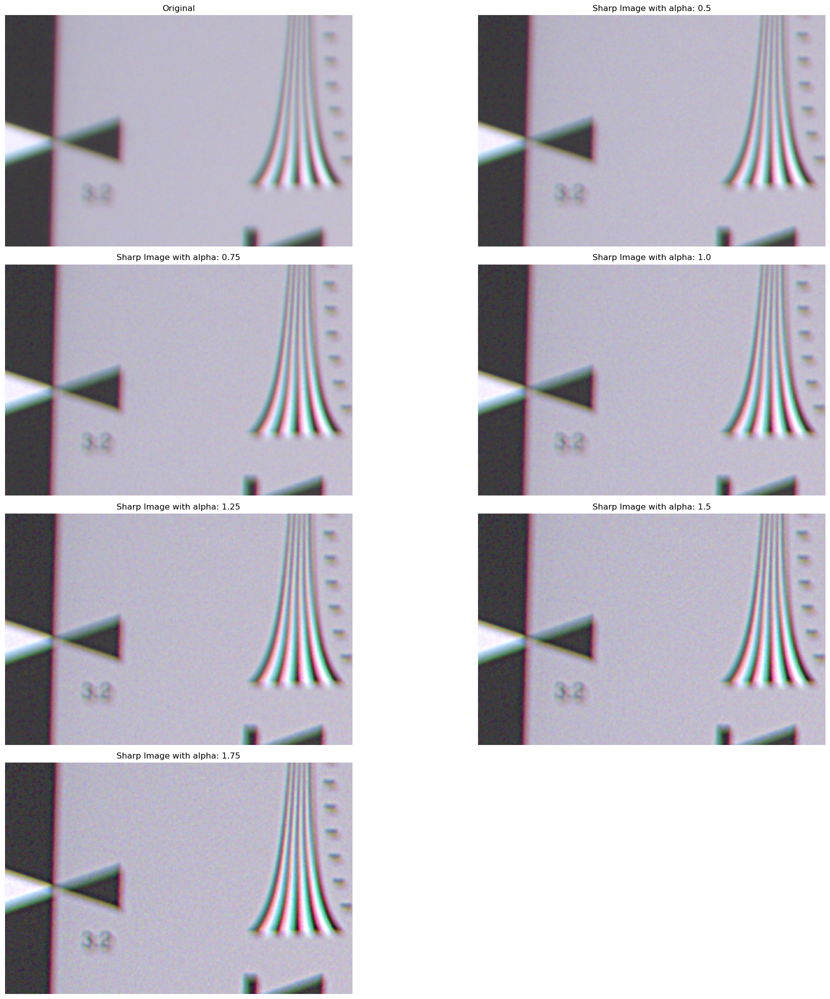

In [20]:
# apply edge enhancement
# hint: implement Laplacian or unsharp mask filtering from previous course material.

bayer_original = bayer_gamma_correction.astype(np.float32)
bayer_blurred  = bayer_bilateral.astype(np.float32)
bayer_mask = bayer_original - bayer_blurred

bayer_mask_disp = bayer_mask.copy()

bayer_mask_disp = (bayer_mask_disp - bayer_mask_disp.min()) / (bayer_mask_disp.max() - bayer_mask_disp.min())

alpha_values = [0.5, 0.75, 1.0, 1.25, 1.5, 1.75]

bayer_sharp = np.clip(bayer_original + 0.75 * bayer_mask, 0 , 255).astype(np.uint8)

plt.figure(figsize=(15, 15))
plt.imshow(bayer_mask_disp)
plt.title('Masked Image')
plt.axis('off')
plt.show()

plt.figure(figsize=(20, 20))

plt.subplot(4, 2, 1)
plt.imshow(bayer_original[600:800, 600:900]/255.0)
plt.title('Original')
plt.axis('off')

for i,alpha_value in enumerate(alpha_values):
    plt.subplot(4, 2, i+2)
    bayer_sharp = np.clip(bayer_original + alpha_value * bayer_mask, 0 , 255).astype(np.uint8)
    plt.imshow(bayer_sharp[600:800, 600:900])
    plt.axis('off')
    plt.title(f'Sharp Image with alpha: {alpha_value}')
    
plt.tight_layout()
plt.show();

## My Observations on Unsharp Masking

-> I am using bilateral filter for blurring and removing this from original to get the masked image

-> I experimented with alpha values from 0.5 to 1.75

-> As the alpha value increases, the image gets sharper and you get an additional noise along with this (in alpha 1.75).

-> I am going with alpha value 0.75 for convenience. It looks sharper with less noise compared to others

## Apply contrast enhancement

Finally, apply contrast enhancement to the image. It is up to the student to select the contrast enhancement used. One option would be adaptive histogram equalization, covered in Section 2 (check out the skimage exposure library). Experiment with different approaches and parameters. Following this, comment on the impact of these approaches/variations. Consider aspects such as (but not limited to) computational cost, artifact generation, and preservation of image details. 

Finally, if you wish, add some overall comments on your approach to the  assignment as a whole, what did you learn, any spcific insights etc. 


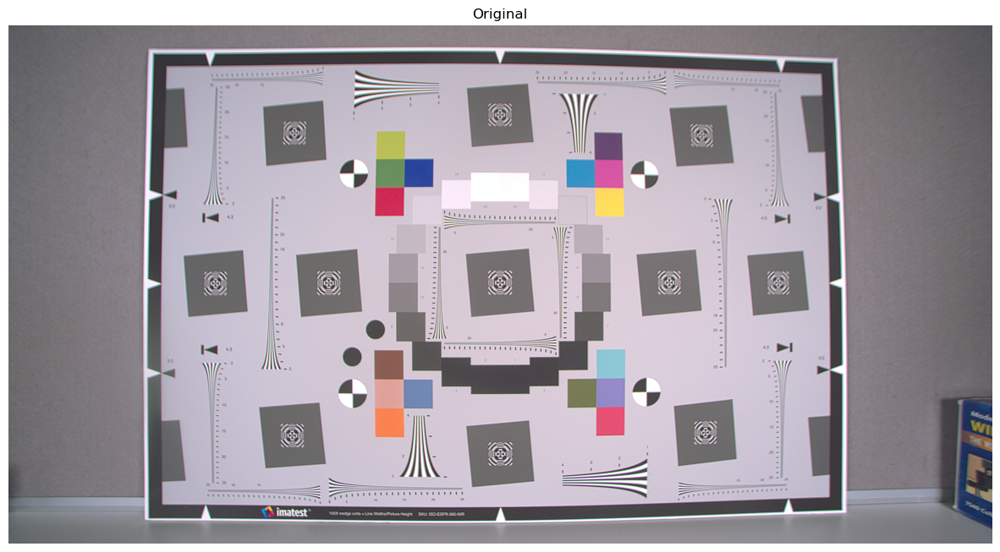

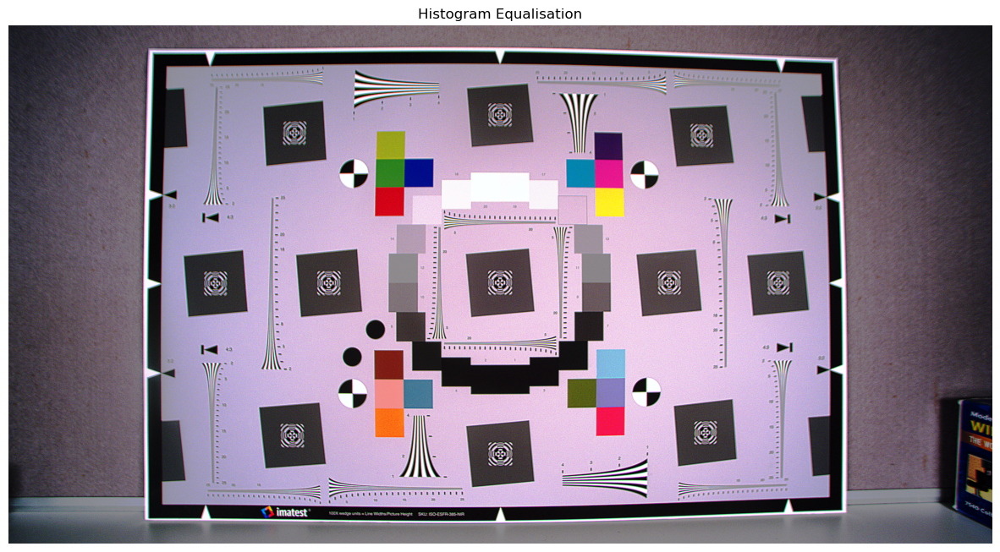

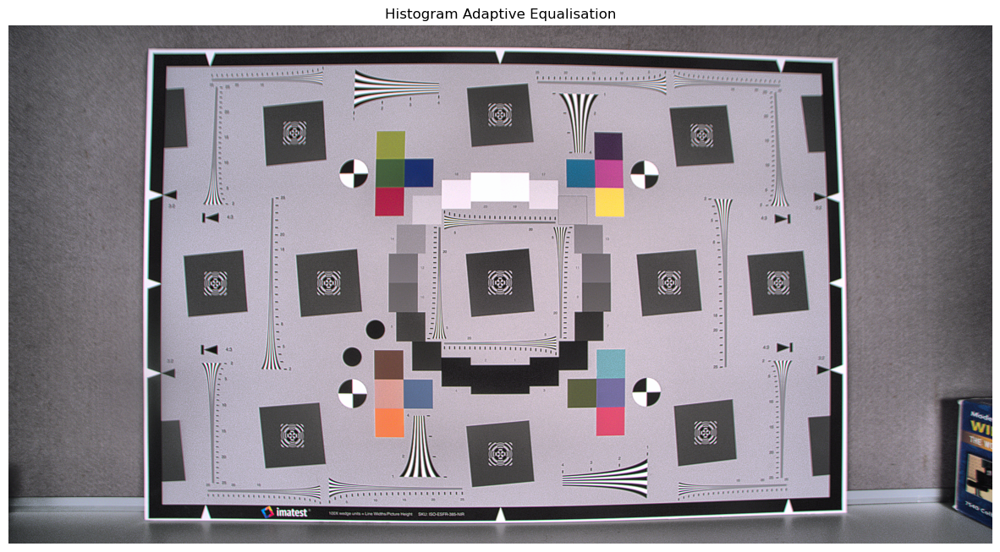

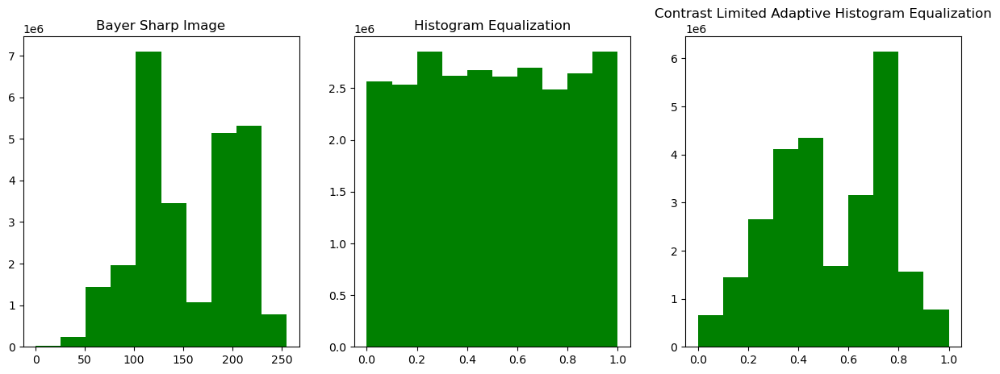

In [23]:
# increase image contrast. Hint - check out skimage exposure
bayer_eq = exposure.equalize_hist(bayer_sharp)

bayer_adapteq = exposure.equalize_adapthist(bayer_sharp, clip_limit=0.01)

# plot the resulting raw file inline
plt.figure(figsize=(15, 15))
plt.imshow(bayer_sharp)
plt.axis('off')
plt.title('Original')
plt.show();

plt.figure(figsize=(15, 15))
plt.imshow(bayer_eq)
plt.axis('off')
plt.title('Histogram Equalisation')
plt.show();

plt.figure(figsize=(15, 15))
plt.imshow(bayer_adapteq)
plt.axis('off')
plt.title('Histogram Adaptive Equalisation')
plt.show();

images = [bayer_sharp, bayer_eq, bayer_adapteq]
titles = ['Bayer Sharp Image', 'Histogram Equalization', 'Contrast Limited Adaptive Histogram Equalisation']
plt.figure(figsize=(15, 5))
for i in range(3):
    plt.subplot(1,3,i+1), plt.hist(images[i].ravel(), color='g'), plt.title(titles[i])
plt.show();

## My Obsevations on Histogram Equalisation

-> I applied histogram equalisation (HE), contrast limited adaptive histogram equalisation (AHE) on sharp image

-> The original looks a bit washed out, HE image has a pink tint and AHE looks more natural

-> With clip_limit 0.03, the contrast is so high it creates black shades from the corners in image, but with 0.01 it looks more natural and has higher contrast compared to sharp image

## Overall Comments 

-> I got to know that raw images are typically grey-scale, which can be converted to color-grade (RGB) by demosaicing the image.

-> The several type of filters used for denoising or smoothing (avg filter, gaussian filter, bilateral filter). Their effectiveness over different study cases. In this case for me, bilateral produced better results.

-> Denoising or blurring may lead to loose clarity of the image.

-> Also got to know that applying edge enhancement causes extra noise in the image.

-> Contrast enhancement using histogram equivalents.